In [43]:
import pandas as pd
import numpy as np

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

from fbprophet import Prophet

init_notebook_mode(connected=True)

In [2]:
columns = ['id', 'ts', 'station_name', 'address', 'total_docks', 'docks_in_service',
          'available_docks', 'available_bikes', 'percent_full', 'status', 'lat', 'lon',
          'position', 'record']
# load preprocessed chicago dataset
df = pd.read_csv('./datasets/chicago.csv', names=columns)

## Get dock stations points

In [6]:
stations_df = df[['id', 'station_name', 'address', 'lat', 'lon']].drop_duplicates()
stations_df.to_csv('./datasets/chicago_stations.csv', index=False)

## Dock stations time series overview

In [26]:
# df['ts'] = pd.to_datetime(df['ts'])
by_dock_df = df.set_index(['id'])[['ts', 'total_docks', 'available_docks', 'available_bikes', 'percent_full']]
dock_ids = np.sort(df['id'].unique())

In [66]:
dock_id = 3
dock_df = by_dock_df.loc[dock_id]
dock_df.loc[:, 'ts'] = pd.to_datetime(dock_df['ts'])
# round ts every 5 minutes (seconds are not aligned)
dock_df.loc[:, 'ts'] = dock_df.ts.dt.round('5min')
dock_df.sort_values(by='ts', inplace=True)

/Users/jordi/.pyenv/versions/3.6.5/envs/master/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/Users/jordi/.pyenv/versions/3.6.5/envs/master/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [67]:
iplot([go.Scatter(x=dock_df['ts'], y=dock_df['available_bikes'], name='available_bikes'),
      go.Scatter(x=dock_df['ts'], y=dock_df['total_docks'], name='total_docks')])

In [68]:
test_start = '20181001'
test_end = '20181026'

train_df = dock_df.query('ts < {}'.format(test_start))
test_df = dock_df.query('{} <= ts <= {}'.format(test_start, test_end))
train_df.shape, test_df.shape

((91157, 5), (3597, 5))

In [69]:
train_df.ts.min(), train_df.ts.max(), test_df.ts.min(), test_df.ts.max()

(Timestamp('2017-01-01 00:05:00'),
 Timestamp('2018-09-30 23:55:00'),
 Timestamp('2018-10-01 00:05:00'),
 Timestamp('2018-10-25 23:55:00'))

In [70]:
train_df.head()

,ts,total_docks,available_docks,available_bikes,percent_full
id,,,,,
3,2017-01-01 00:05:00,31,14,15,52
3,2017-01-01 00:15:00,31,14,15,52
3,2017-01-01 00:25:00,31,14,15,52
3,2017-01-01 00:35:00,31,14,15,52
3,2017-01-01 00:45:00,31,14,15,52


In [134]:
prophet_input = pd.DataFrame({'ds': train_df['ts'], 
                              'y': train_df['available_bikes'], 
                              'cap': np.max(train_df['total_docks'])})
model = Prophet(changepoint_prior_scale=100, seasonality_prior_scale=100, uncertainty_samples=100, growth='logistic').fit(prophet_input)
# we have data every 10 minutes with an offset of 5 minutes at hourly level
future = pd.DataFrame({'ds': pd.date_range(test_start, test_end, freq='10min') + pd.DateOffset(minutes=5),
                      'cap': np.max(train_df['total_docks'])})
forecast = model.predict(future)

INFO:fbprophet.forecaster:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


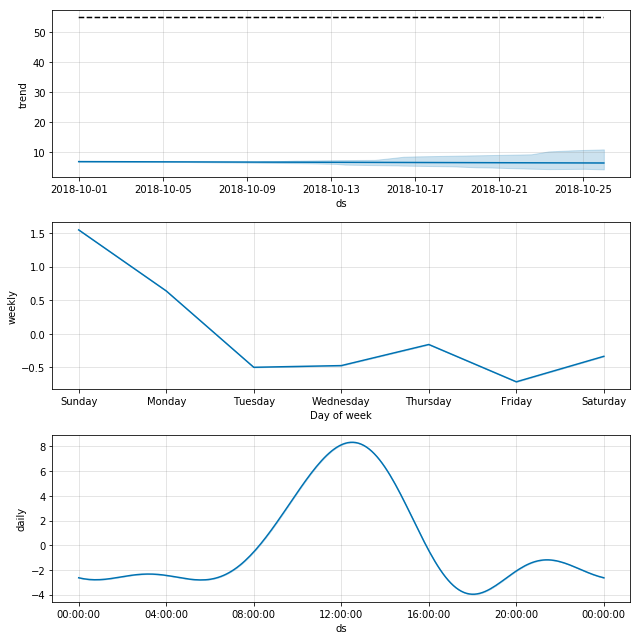

In [136]:
_ = model.plot_components(forecast)

In [137]:
y_true = test_df.available_bikes
y_hat = forecast.yhat

iplot([go.Scatter(x=test_df.ts, y=y_true, name='y_true'), go.Scatter(x=test_df.ts, y=y_hat, name='y_hat')])

In [138]:
# rmse
np.sqrt(np.mean((y_true-y_hat)**2))

7.562795893400781

## Trips

In [147]:
columns = ['trip_id', 'start', 'stop', 'bike_id', 'trip_duration',
          'from_station_id', 'from_station_name', 'to_station_id',
          'to_station_name', 'user_type', 'gender', 'birth_year',
          'from_lat', 'from_lon', 'from_loc', 'to_lat', 'to_lon', 'to_loc']
trips_df = pd.read_csv('datasets/chicago_trips.csv', header=None, usecols=np.arange(18))
trips_df.columns = columns

In [148]:
trips_df.head()

,trip_id,start,stop,bike_id,trip_duration,from_station_id,from_station_name,to_station_id,to_station_name,user_type,gender,birth_year,from_lat,from_lon,from_loc,to_lat,to_lon,to_loc
0,19244620,06/30/2018 11:59:56 PM,07/01/2018 12:17:14 AM,4360,1038,38,Clark St & Lake St,338,Calumet Ave & 18th St,Subscriber,Female,1985.0,41.886021,-87.630876,POINT (-87.6308760584 41.88602082773),41.857611,-87.619407,POINT (-87.619407 41.857611)
1,19244621,06/30/2018 11:59:55 PM,07/01/2018 12:38:10 AM,401,2295,284,Michigan Ave & Jackson Blvd,340,Clark St & Wrightwood Ave,Subscriber,Male,1989.0,41.877850,-87.624080,POINT (-87.62408 41.87785),41.929546,-87.643118,POINT (-87.643118 41.929546)
2,19244619,06/30/2018 11:59:48 PM,07/01/2018 12:08:45 AM,3646,537,260,Kedzie Ave & Milwaukee Ave,506,Spaulding Ave & Armitage Ave,Subscriber,Male,1980.0,41.929567,-87.707857,POINT (-87.707857 41.929567),41.917184,-87.710357,POINT (-87.7103566522 41.91718375155)
3,19244618,06/30/2018 11:59:27 PM,07/01/2018 12:06:33 AM,338,426,141,Clark St & Lincoln Ave,313,Lakeview Ave & Fullerton Pkwy,Customer,NaN,NaN,41.915689,-87.634600,POINT (-87.6346 41.915689),41.925858,-87.638973,POINT (-87.638973 41.925858)
4,19244617,06/30/2018 11:59:20 PM,07/01/2018 12:06:33 AM,5851,433,141,Clark St & Lincoln Ave,313,Lakeview Ave & Fullerton Pkwy,Customer,NaN,NaN,41.915689,-87.634600,POINT (-87.6346 41.915689),41.925858,-87.638973,POINT (-87.638973 41.925858)
